# Project 1: Analysis and Forecasting of NYC Taxi Rides
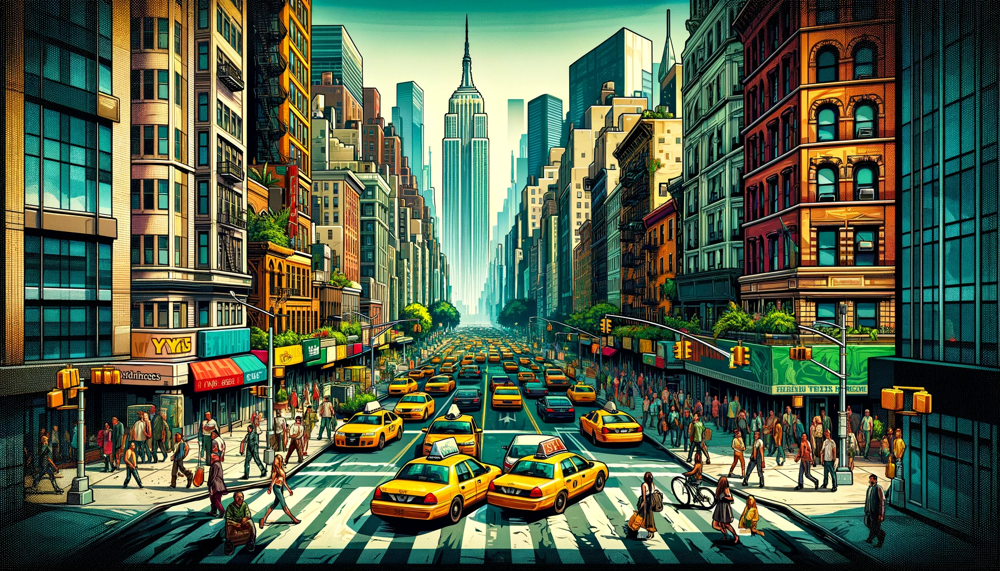

#### **Group 12: Nikolaj, Steffen, Sara and Negina (C.DSM), January 2025**

In [1]:
# The code makes sure that once there is change in the 'src/' folder, the 
# change will be automatically reloaded in the notebook.
%reload_ext autoreload
%autoreload 2
%aimport src

Note:  
We attempted to export our two projects as they were but encountered an issue with some plots, specifically with a few interactive plots we created.  
To address this and successfully upload our work to GitHub, we replaced the problematic sections (e.g., in the Kepler analysis) with screenshots, while other plots are presented as static images. Unfortunately, this means the plots that were intended to be interactive are no longer functional, and we sincerely apologize for this inconvenience. We hope this issue isn’t too disruptive and that the projects remain satisfactory overall.

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import scipy.stats as stats
import statsmodels.api as sm
import statsmodels.formula.api as smf
import statsmodels.stats.power as smp
import statsmodels.stats.proportion as smprop
from sympy import * 
init_printing()
from src.utils import load_data_from_google_drive
from src.utils import create_scatterplot
import seaborn as sns
from keplergl import KeplerGl
from prophet import Prophet
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from prophet import Prophet
from pandas.api.types import CategoricalDtype
from prophet.diagnostics import cross_validation, performance_metrics
from prophet.plot import plot_plotly
import plotly.graph_objects as go

### Task 1: Understanding the Data

Yellow and green taxi trip records include fields capturing 
- pick-up and drop-off dates/times
- pick-up and drop-off locations
- trip distances
- itemized fares
- rate types
- payment types
- driver-reported passenger counts 
  
The data used in the attached datasets were collected and provided to the NYC Taxi and Limousine Commission (TLC) by technology providers authorized under the Taxicab & Livery Passenger Enhancement Programs (TPEP/LPEP). The trip data was not created by the TLC, and TLC makes no representations as to the accuracy of these data.

**Remark**: Feel free to change the *months* and *year* in the code below, if you need more/less data. 

In [3]:
# Define the base URLs for the yellow and green taxi data
base_url_yellow = "https://d37ci6vzurychx.cloudfront.net/trip-data/yellow_tripdata_{year}-{month}.parquet"
base_url_green = "https://d37ci6vzurychx.cloudfront.net/trip-data/green_tripdata_{year}-{month}.parquet"
zones_url = 'https://drive.google.com/file/d/12VgjWXkyEBsxzuKFxIkAevEbao85ei0T/view?usp=sharing'

# Define the months and year you're interested in
months = ['01', '12']
year = '2023'

# Create empty lists to store the dataframes
df_yellow_list = []
df_green_list = []

# Loop over the months
for month in months:
    # Create the full URL for the yellow and green taxi data
    dfy = pd.read_parquet(base_url_yellow.format(year=year, month=month))
    dfg = pd.read_parquet(base_url_green.format(year=year, month=month))
    
    # Download the data and append it to the list
    df_yellow_list.append(dfy)
    df_green_list.append(dfg)

# Concatenate the list of dataframes into a single dataframe
df_yellow = pd.concat(df_yellow_list)
df_green = pd.concat(df_green_list)

df_zones = load_data_from_google_drive(url=zones_url)

In [4]:
df_yellow.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,airport_fee,Airport_fee
0,2,2023-01-01 00:32:10,2023-01-01 00:40:36,1.0,0.97,1.0,N,161,141,2,9.3,1.00,0.5,0.00,0.0,1.0,14.30,2.5,0.00,NaN
1,2,2023-01-01 00:55:08,2023-01-01 01:01:27,1.0,1.10,1.0,N,43,237,1,7.9,1.00,0.5,4.00,0.0,1.0,16.90,2.5,0.00,NaN
2,2,2023-01-01 00:25:04,2023-01-01 00:37:49,1.0,2.51,1.0,N,48,238,1,14.9,1.00,0.5,15.00,0.0,1.0,34.90,2.5,0.00,NaN
3,1,2023-01-01 00:03:48,2023-01-01 00:13:25,0.0,1.90,1.0,N,138,7,1,12.1,7.25,0.5,0.00,0.0,1.0,20.85,0.0,1.25,NaN
4,2,2023-01-01 00:10:29,2023-01-01 00:21:19,1.0,1.43,1.0,N,107,79,1,11.4,1.00,0.5,3.28,0.0,1.0,19.68,2.5,0.00,NaN


In [5]:
df_green.head()

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,ehail_fee,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge
0,2,2023-01-01 00:26:10,2023-01-01 00:37:11,N,1.0,166,143,1.0,2.58,14.9,1.0,0.5,4.03,0.0,None,1.0,24.18,1.0,1.0,2.75
1,2,2023-01-01 00:51:03,2023-01-01 00:57:49,N,1.0,24,43,1.0,1.81,10.7,1.0,0.5,2.64,0.0,None,1.0,15.84,1.0,1.0,0.00
2,2,2023-01-01 00:35:12,2023-01-01 00:41:32,N,1.0,223,179,1.0,0.00,7.2,1.0,0.5,1.94,0.0,None,1.0,11.64,1.0,1.0,0.00
3,1,2023-01-01 00:13:14,2023-01-01 00:19:03,N,1.0,41,238,1.0,1.30,6.5,0.5,1.5,1.70,0.0,None,1.0,10.20,1.0,1.0,0.00
4,1,2023-01-01 00:33:04,2023-01-01 00:39:02,N,1.0,41,74,1.0,1.10,6.0,0.5,1.5,0.00,0.0,None,1.0,8.00,1.0,1.0,0.00


In [6]:
"""
create_scatterplot(
    df_yellow.sample(50), 
    x_col = 'trip_distance', 
    y_col = 'fare_amount', 
    title = 'trip_distance vs fare_amount', 
    xlabel = 'trip_distance',
    ylabel = 'fare_amount',)
"""

"\ncreate_scatterplot(\n    df_yellow.sample(50), \n    x_col = 'trip_distance', \n    y_col = 'fare_amount', \n    title = 'trip_distance vs fare_amount', \n    xlabel = 'trip_distance',\n    ylabel = 'fare_amount',)\n"

### Task 2: Exploratory Data Analysis
Conduct exploratory data analysis to understand the patterns and relationships in the data. This includes analyzing the distribution of trip distances, fares, and passenger counts, as well as the relationship between these variables. Pay attention to the trip distance (and maybe also fare amount). Are there outliers? Should some data (that looks apparently not practical) be dropped?

#### **Initial analysis**

We have chosen to analyze January and December from the year 2023. To get started we created a new dataset with the relevant attributes (there are 9) and here we found that there was some missing data. This was for columns RatecodeID, payment_type, passenger_count (only Green was missing payment_type). To tackle this issue, we chose to remove the rows of these disturbed data points, since removing them still leaves a sufficient amount of data to analyze. All of this was done in the code above!
Now we are ready to look closer into the data. Next step will be to conduct a basic statistical analysis; here we will make histograms, box plots, scatter plots for each variable as effective visuals. Lastly we will make a correlation matrix to visualize the relationships between the attributes. Before doing so, we will remove attributes from data that hinders a comprehensive statistical analysis. All of these visualizations are made on the basis of textbook practice from Chapter 2. An example of how this principle is applied could be the use of color saturation for the heatmap. Here we use bold and warm colors such as red/peach to indicate higher correlation and mild, colder colors for those that are not highly correlated, and even darker colors for the ones that are negatively correlated. 


In [7]:
# Define columns yellow
columns_yellow = [
    'tpep_pickup_datetime', 'tpep_dropoff_datetime', 'PULocationID', 'DOLocationID',
    'trip_distance', 'fare_amount', 'payment_type', 'passenger_count']

# Define columns green
columns_green = [
    'lpep_pickup_datetime', 'lpep_dropoff_datetime', 'PULocationID', 'DOLocationID',
    'trip_distance', 'fare_amount', 'payment_type', 'passenger_count']

# Create filtered dataframes for green and yellow
df_yellow_filtered = df_yellow[columns_yellow]
df_green_filtered = df_green[columns_green]

# Filter for all negative and NaN values
non_datetime_columns_y = df_yellow_filtered.select_dtypes(exclude=['datetime']).columns
non_datetime_columns_g = df_green_filtered.select_dtypes(exclude=['datetime']).columns
df_yellow_filtered = df_yellow_filtered[(df_yellow_filtered[non_datetime_columns_y] >= 0).all(axis=1)]
df_green_filtered = df_green_filtered[(df_green_filtered[non_datetime_columns_g] >= 0).all(axis=1)]

In [8]:
df_yellow_filtered.head()

,tpep_pickup_datetime,tpep_dropoff_datetime,PULocationID,DOLocationID,trip_distance,fare_amount,payment_type,passenger_count
0,2023-01-01 00:32:10,2023-01-01 00:40:36,161,141,0.97,9.3,2,1.0
1,2023-01-01 00:55:08,2023-01-01 01:01:27,43,237,1.10,7.9,1,1.0
2,2023-01-01 00:25:04,2023-01-01 00:37:49,48,238,2.51,14.9,1,1.0
3,2023-01-01 00:03:48,2023-01-01 00:13:25,138,7,1.90,12.1,1,0.0
4,2023-01-01 00:10:29,2023-01-01 00:21:19,107,79,1.43,11.4,1,1.0


In [9]:
df_green_filtered.head()

,lpep_pickup_datetime,lpep_dropoff_datetime,PULocationID,DOLocationID,trip_distance,fare_amount,payment_type,passenger_count
0,2023-01-01 00:26:10,2023-01-01 00:37:11,166,143,2.58,14.9,1.0,1.0
1,2023-01-01 00:51:03,2023-01-01 00:57:49,24,43,1.81,10.7,1.0,1.0
2,2023-01-01 00:35:12,2023-01-01 00:41:32,223,179,0.00,7.2,1.0,1.0
3,2023-01-01 00:13:14,2023-01-01 00:19:03,41,238,1.30,6.5,1.0,1.0
4,2023-01-01 00:33:04,2023-01-01 00:39:02,41,74,1.10,6.0,1.0,1.0


### **Histograms**

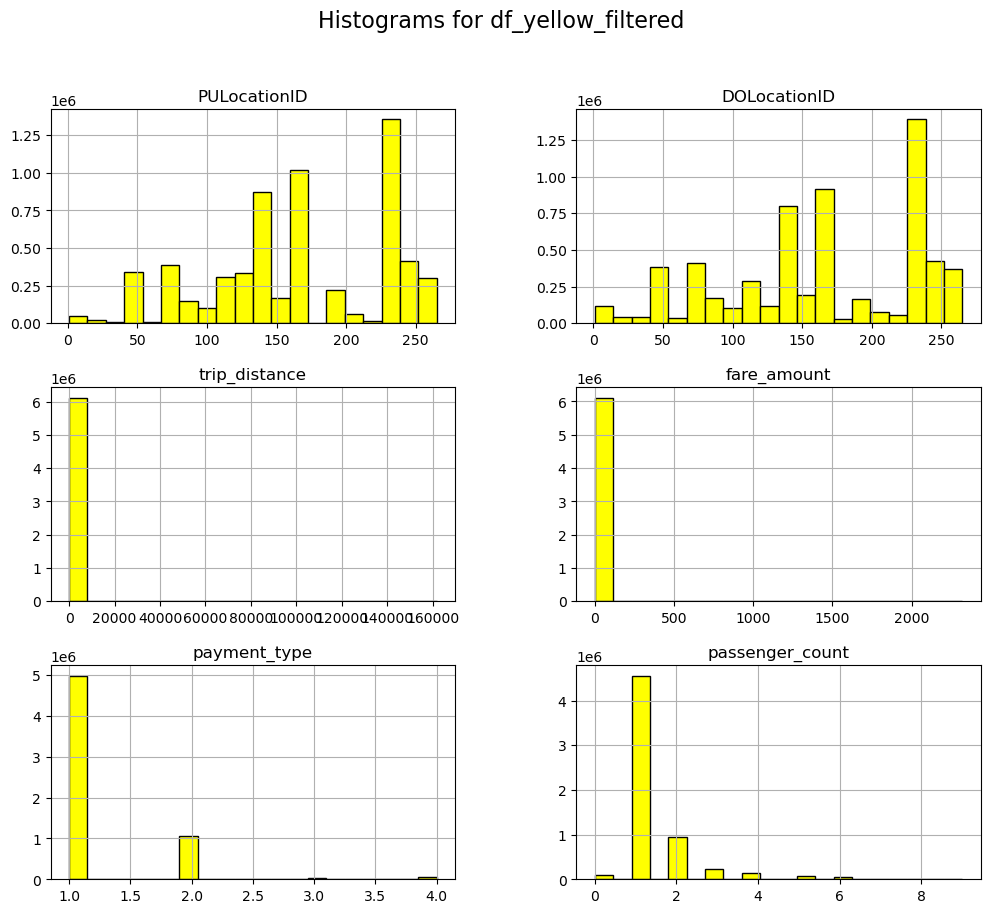

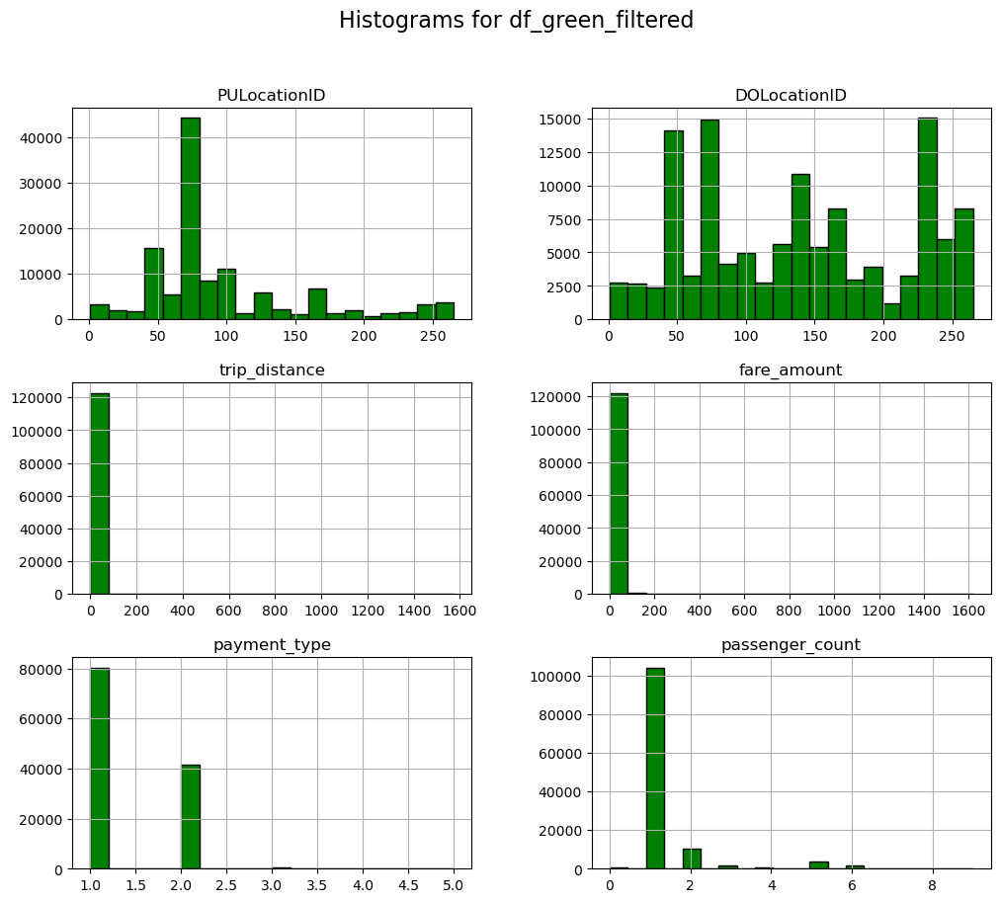

In [10]:
# Create histograms to vizsalize the data adn create an overview for any outliers for both green and yellow taxis
df_yellow_filtered_hist = df_yellow_filtered.drop(columns=['tpep_pickup_datetime', 'tpep_dropoff_datetime'])
df_green_filtered_hist = df_green_filtered.drop(columns=['lpep_pickup_datetime', 'lpep_dropoff_datetime'])

df_yellow_filtered_hist.hist(figsize=(12, 10), bins=20, color='yellow', edgecolor='black')
plt.suptitle("Histograms for df_yellow_filtered", fontsize=16)
plt.show()

df_green_filtered_hist.hist(figsize=(12, 10), bins=20, color='green', edgecolor='black')
plt.suptitle("Histograms for df_green_filtered", fontsize=16)
plt.show()


It's observed that there could be some outliers in "trip_distance" and "fare_amount" due to the scewed/disturbed histograms.

In [11]:
# count of potential outliers and in the three categories 
print(df_yellow_filtered_hist[df_yellow_filtered_hist['trip_distance'] > 50].shape[0])
print(df_yellow_filtered_hist[df_yellow_filtered_hist['fare_amount'] > 100].shape[0])

print(df_green_filtered_hist[df_green_filtered_hist['trip_distance'] > 50].shape[0])
print(df_green_filtered_hist[df_green_filtered_hist['fare_amount'] > 100].shape[0])

703
17907
16
448


By the conservative thresholds set, will the impact of removeing values equal to or over these not have an massive impact on the overall dataset, due to the low percentage that they constitute.

In [12]:
df_yellow_filtered = df_yellow_filtered[
    (df_yellow_filtered['trip_distance'] <= 50) & 
    (df_yellow_filtered['fare_amount'] <= 100) ]

# Apply thresholds to df_green_filtered
df_green_filtered = df_green_filtered[
    (df_green_filtered['trip_distance'] <= 50) & 
    (df_green_filtered['fare_amount'] <= 100) ]

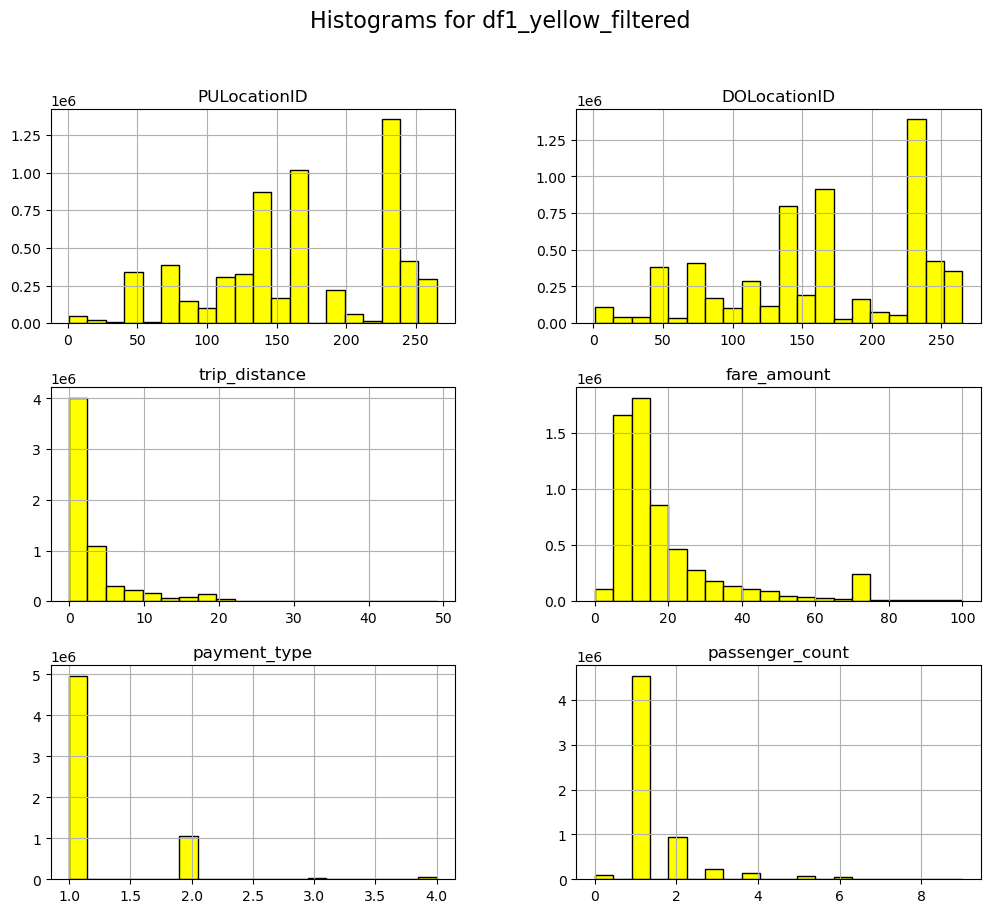

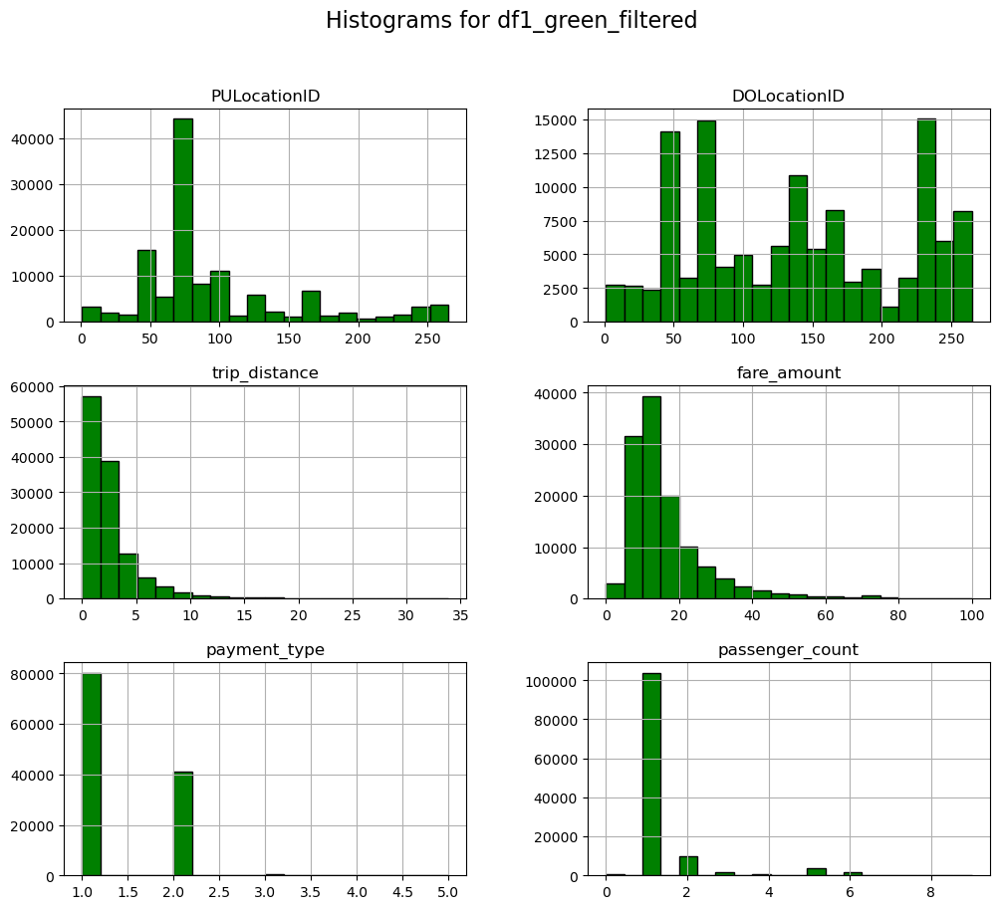

In [13]:
# Apply thresholds to df_yellow_filtered
df1_yellow_filtered_hist = df_yellow_filtered_hist[
    (df_yellow_filtered_hist['trip_distance'] <= 50) & 
    (df_yellow_filtered_hist['fare_amount'] <= 100) ]

# Apply thresholds to df_green_filtered
df1_green_filtered_hist = df_green_filtered_hist[
    (df_green_filtered_hist['trip_distance'] <= 50) & 
    (df_green_filtered_hist['fare_amount'] <= 100) ]

# Create histograms to vizsalize the data adn create an overview for any outliers for both green and yellow taxis
df1_yellow_filtered_hist.hist(figsize=(12, 10), bins=20, color='yellow', edgecolor='black')
plt.suptitle("Histograms for df1_yellow_filtered", fontsize=16)
plt.show()

df1_green_filtered_hist.hist(figsize=(12, 10), bins=20, color='green', edgecolor='black')
plt.suptitle("Histograms for df1_green_filtered", fontsize=16)
plt.show()

#### **Correlation Matrix / Heatmap**

Furthermore to understand the relationship between the different attributes a correlation matrix is created

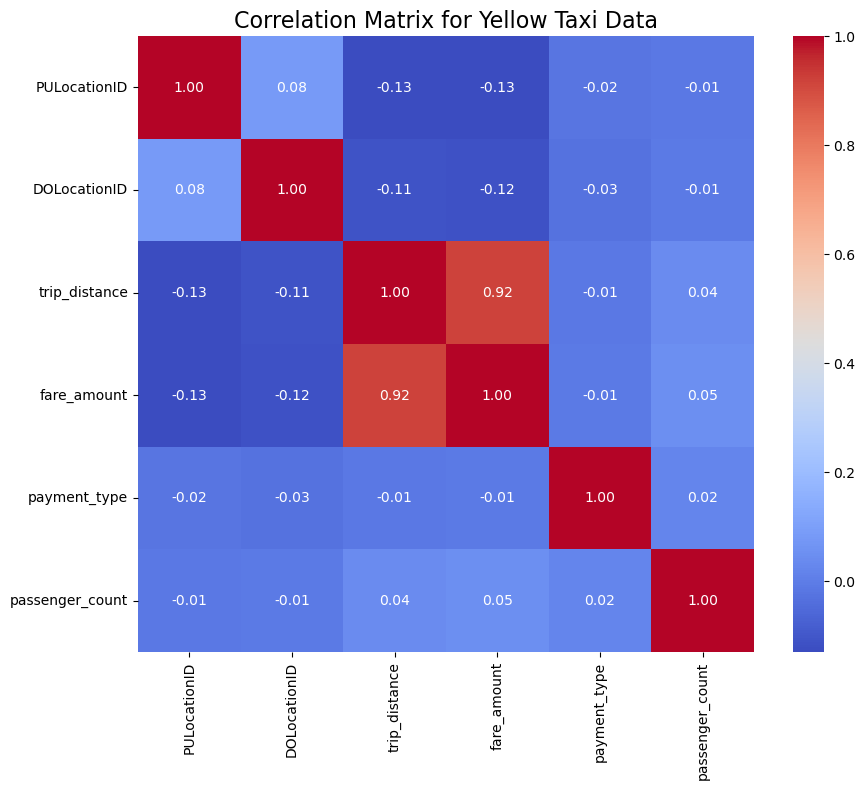

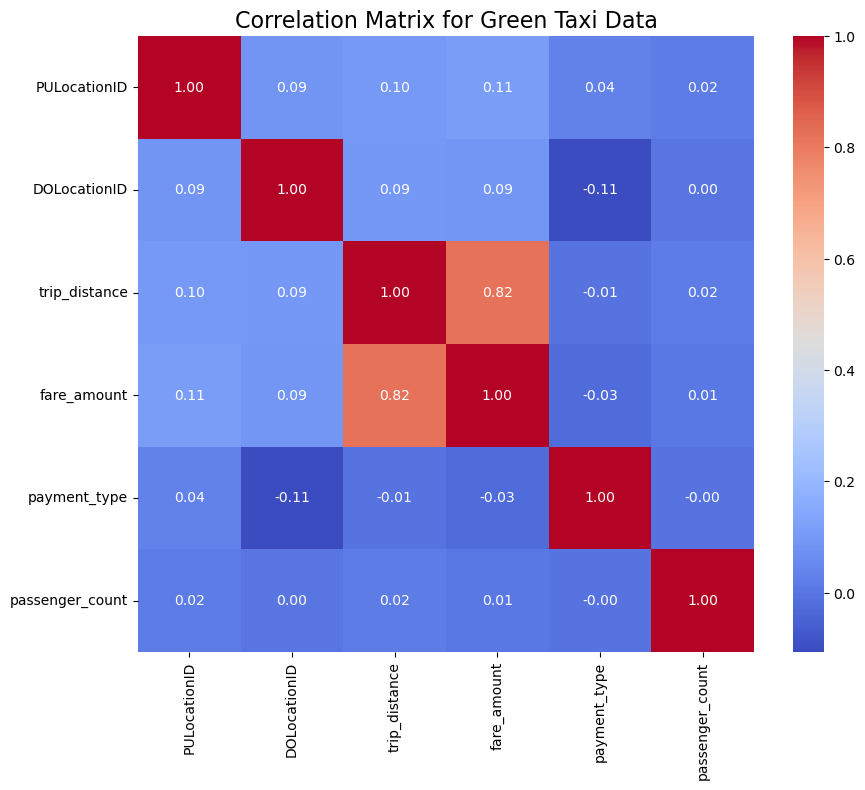

In [14]:
# Function to create a correlation matrix heatmap
def create_correlation_matrix(data, title):
    # Calculate the correlation matrix
    corr_matrix = data.corr()
    
    # Create a heatmap
    plt.figure(figsize=(10, 8))
    sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", cbar=True, square=True)
    plt.title(title, fontsize=16)
    plt.show()

# Correlation matrix for yellow taxi data
create_correlation_matrix(df1_yellow_filtered_hist, "Correlation Matrix for Yellow Taxi Data")

# Correlation matrix for green taxi data
create_correlation_matrix(df1_green_filtered_hist, "Correlation Matrix for Green Taxi Data")

**Textbook Practice**:
Apply the principle of "choosing an effective visual" in Chapter 2 to make the visualization. Explain how this principle is applied.

**We touched upon this in the introduction of this task, so we kindly refer you to the first section of Task 2!**

### Task 3: Spatial Analysis
Use Kepler.gl (https://kepler.gl/) or similar tools/packages to visualize the spatial patterns of taxi rides. This includes the pickup and dropoff locations, as well as the routes taken. Analyze the spatial patterns to identify hotspots of taxi demand.

You can find a good tutorial on https://docs.kepler.gl/docs/keplergl-jupyter#install for how to use it in jupyter notebook with python.

**Hint** In order to visualize the pickup/dropoff location geographically, you might need to know the latitude (lat) and longitude (lng) for each location. You can find the corresponding information in the dataframe "df_zones".

**Important** Try **NOT** to load too many data to kepler, as it cannot handle many data at one time. Try visualize the pattern for just 1-2 hours first.

In [15]:
# Removing duplicates by keeping the first occurrence
df_zones = df_zones.drop_duplicates(subset='LocationID', keep='first')
df_zones.head()

,Shape_Leng,Shape_Area,zone,LocationID,borough,lat,lng
0,0.116357,0.000782,Newark Airport,1,EWR,40.689516,-74.176786
1,0.433470,0.004866,Jamaica Bay,2,Queens,40.625724,-73.826126
2,0.084341,0.000314,Allerton/Pelham Gardens,3,Bronx,40.865888,-73.849479
3,0.043567,0.000112,Alphabet City,4,Manhattan,40.724152,-73.977023
4,0.092146,0.000498,Arden Heights,5,Staten Island,40.550340,-74.189930


In [16]:
# Remove duplicate zone entries
df_zones = df_zones.drop_duplicates(subset='LocationID', keep='first')

# Define the time span
start_time = '2023-01-03 10:00:00'
end_time = '2023-01-03 12:00:00'

# Select relevant columns for analysis
selected_columns = ['tpep_pickup_datetime', 'tpep_dropoff_datetime', 'PULocationID', 'DOLocationID', 'fare_amount']

# Filter yellow taxi data for the defined time range
df_yellow_filtered_kep = df_yellow_filtered[
    (df_yellow_filtered['tpep_pickup_datetime'] >= start_time) & 
    (df_yellow_filtered['tpep_pickup_datetime'] <= end_time)
][selected_columns]

# Merge pick-up location data
df_yellow_filtered_kep = df_yellow_filtered_kep.merge(
    df_zones[['LocationID', 'lat', 'lng']],
    left_on='PULocationID',
    right_on='LocationID',
    how='left'
)
df_yellow_filtered_kep.rename(
    columns={'lat': 'pickup_lat', 'lng': 'pickup_lng'}, inplace=True)
df_yellow_filtered_kep.drop('LocationID', axis=1, inplace=True)

# Merge drop-off location data
df_yellow_filtered_kep = df_yellow_filtered_kep.merge(
    df_zones[['LocationID', 'lat', 'lng']],
    left_on='DOLocationID',
    right_on='LocationID',
    how='left'
)
df_yellow_filtered_kep.rename(
    columns={'lat': 'dropoff_lat', 'lng': 'dropoff_lng'}, inplace=True)
df_yellow_filtered_kep.drop('LocationID', axis=1, inplace=True)

# Convert datetime columns to string format for Kepler.gl
df_yellow_filtered_kep['tpep_pickup_datetime'] = df_yellow_filtered_kep['tpep_pickup_datetime'].astype(str)
df_yellow_filtered_kep['tpep_dropoff_datetime'] = df_yellow_filtered_kep['tpep_dropoff_datetime'].astype(str)


map_1 = KeplerGl(height=500, data={'yellow_taxi': df_yellow_filtered_kep})
map_1 # For selecting the heatmaps press pickup and dropoff and change the "Basic" from points to heatmap
      # See the routes taken by pressing pickup -> dropoff arc

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


/opt/anaconda3/lib/python3.12/site-packages/jupyter_client/session.py:721: UserWarning: Message serialization failed with:
Out of range float values are not JSON compliant: nan
Supporting this message is deprecated in jupyter-client 7, please make sure your message is JSON-compliant
  content = self.pack(content)


KeplerGl(data={'yellow_taxi':       tpep_pickup_datetime tpep_dropoff_datetime  PULocationID  DOLocationID  \
…

### Yellow Taxis: Pick-up, Drop-off and routes

For selecting the heatmaps press pickup and dropoff and change the "Basic" from points to heatmap

See the routes taken by pressing pickup -> dropoff arc 

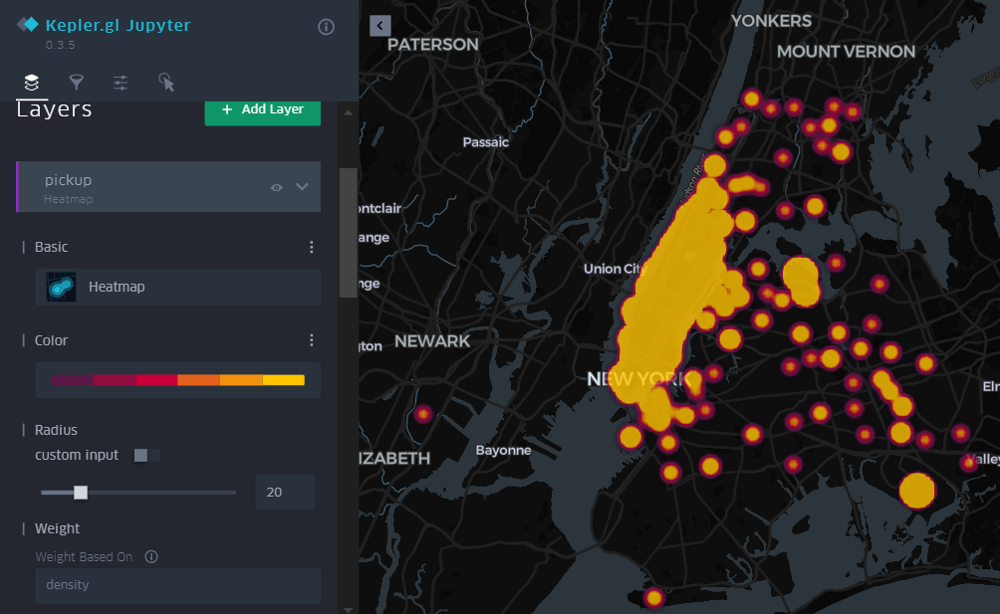

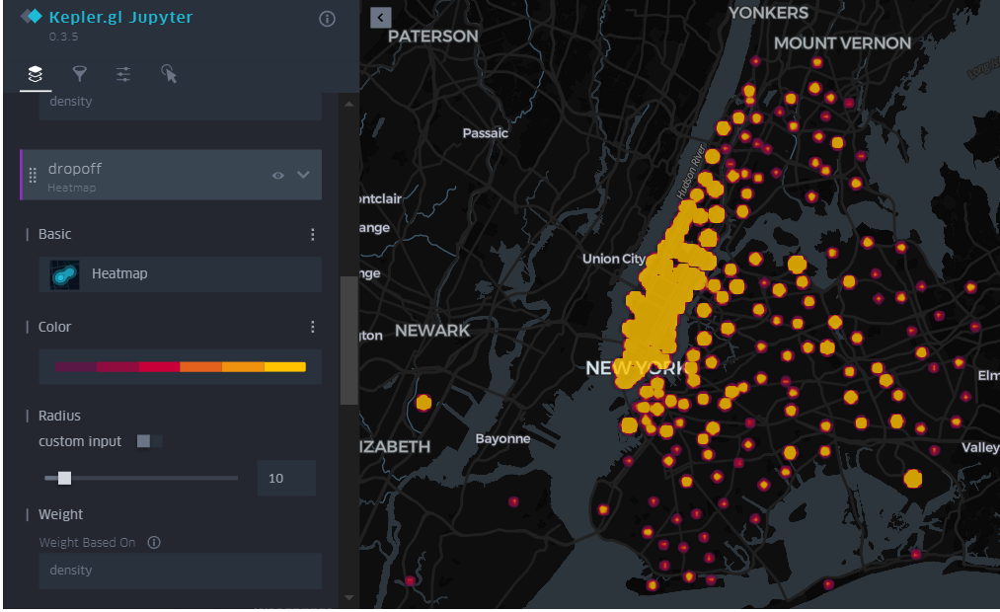

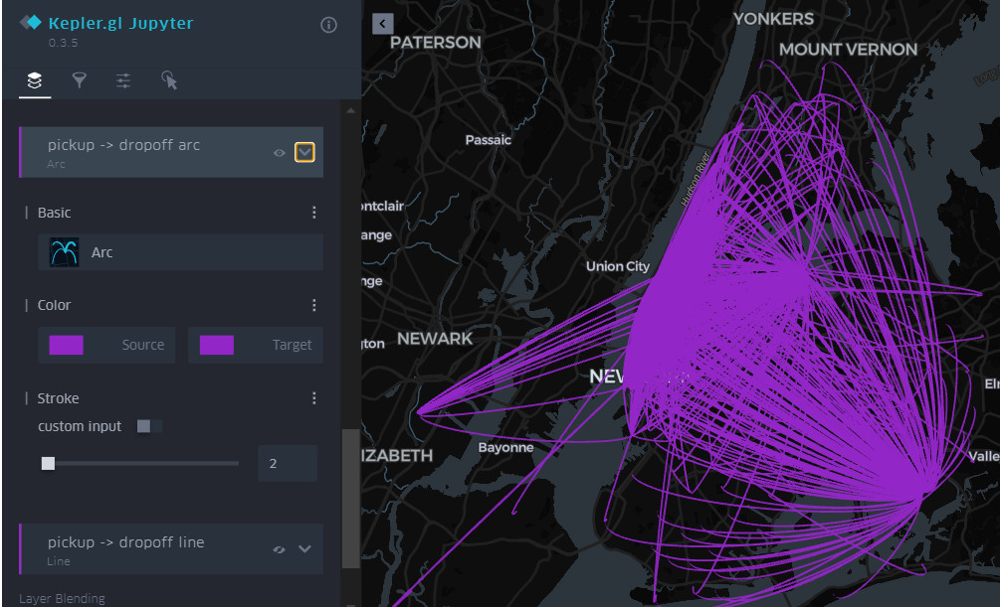

In [17]:
# Remove duplicate zone entries
df_zones = df_zones.drop_duplicates(subset='LocationID', keep='first')

# Define the time span
start_time = '2023-01-03 10:00:00'
end_time = '2023-01-03 12:00:00'

# Select relevant columns for analysis
selected_columns = ['lpep_pickup_datetime', 'lpep_dropoff_datetime', 'PULocationID', 'DOLocationID', 'fare_amount']

# Filter yellow taxi data for the defined time range
df_green_filtered_kep = df_green_filtered[
    (df_green_filtered['lpep_pickup_datetime'] >= start_time) & 
    (df_green_filtered['lpep_pickup_datetime'] <= end_time)
][selected_columns]

# Merge pick-up location data
df_green_filtered_kep = df_green_filtered_kep.merge(
    df_zones[['LocationID', 'lat', 'lng']],
    left_on='PULocationID',
    right_on='LocationID',
    how='left'
)
df_green_filtered_kep.rename(
    columns={'lat': 'pickup_lat', 'lng': 'pickup_lng'}, inplace=True)
df_green_filtered_kep.drop('LocationID', axis=1, inplace=True)

# Merge drop-off location data
df_green_filtered_kep = df_green_filtered_kep.merge(
    df_zones[['LocationID', 'lat', 'lng']],
    left_on='DOLocationID',
    right_on='LocationID',
    how='left'
)
df_green_filtered_kep.rename(
    columns={'lat': 'dropoff_lat', 'lng': 'dropoff_lng'}, inplace=True)
df_green_filtered_kep.drop('LocationID', axis=1, inplace=True)

# Convert datetime columns to string format for Kepler.gl
df_green_filtered_kep['lpep_pickup_datetime'] = df_green_filtered_kep['lpep_pickup_datetime'].astype(str)
df_green_filtered_kep['lpep_dropoff_datetime'] = df_green_filtered_kep['lpep_dropoff_datetime'].astype(str)

map_2 = KeplerGl(height=500, data={'green_taxi': df_green_filtered_kep})
map_2 # For selecting the heatmaps press pickup and dropoff and change the "Basic" from points to heatmap
      # See the routes taken by pressing pickup -> dropoff arc 

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


/opt/anaconda3/lib/python3.12/site-packages/jupyter_client/session.py:721: UserWarning: Message serialization failed with:
Out of range float values are not JSON compliant: nan
Supporting this message is deprecated in jupyter-client 7, please make sure your message is JSON-compliant
  content = self.pack(content)


KeplerGl(data={'green_taxi':     lpep_pickup_datetime lpep_dropoff_datetime  PULocationID  DOLocationID  \
0  …

### Green Taxis: Pick-up, Drop-off and routes

For selecting the heatmaps press pickup and dropoff and change the "Basic" from points to heatmap

See the routes taken by pressing pickup -> dropoff arc 

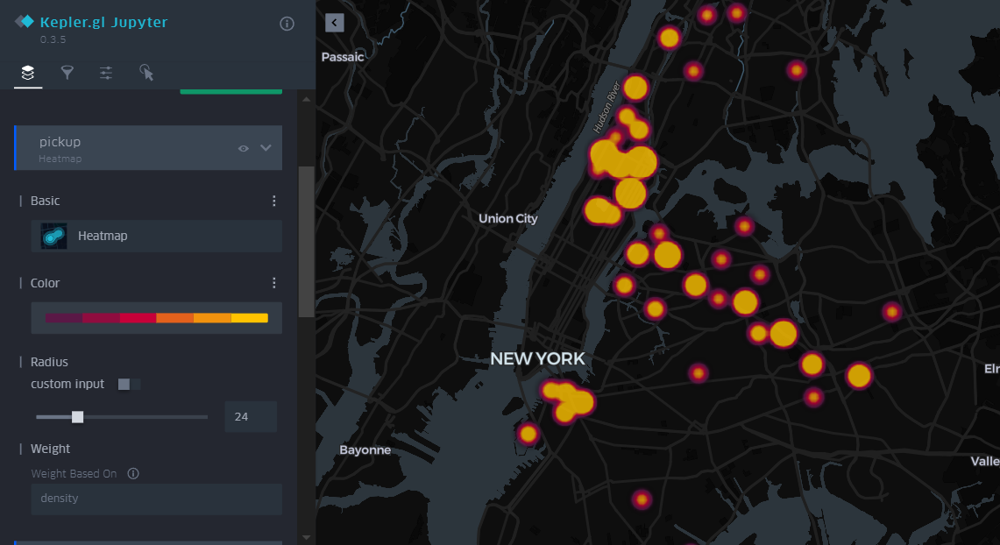

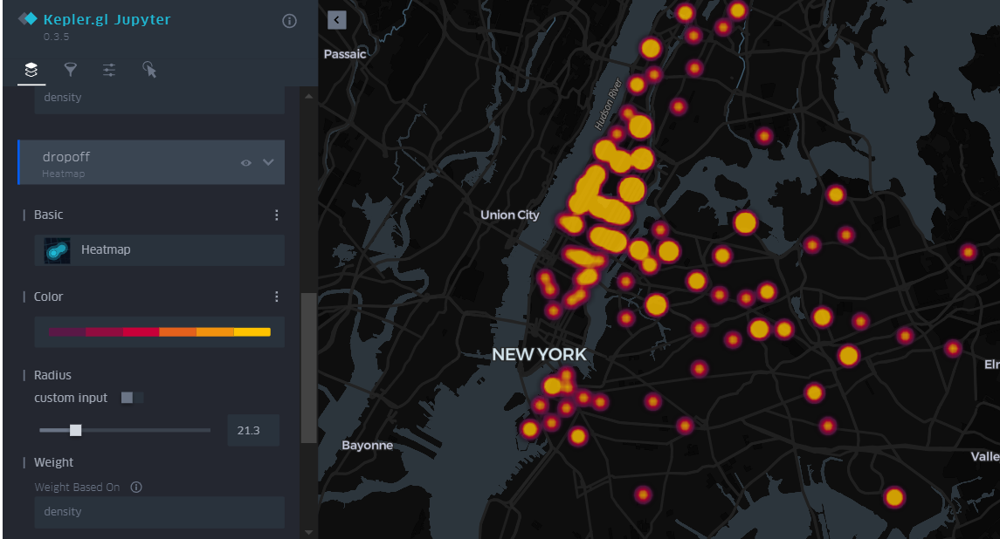

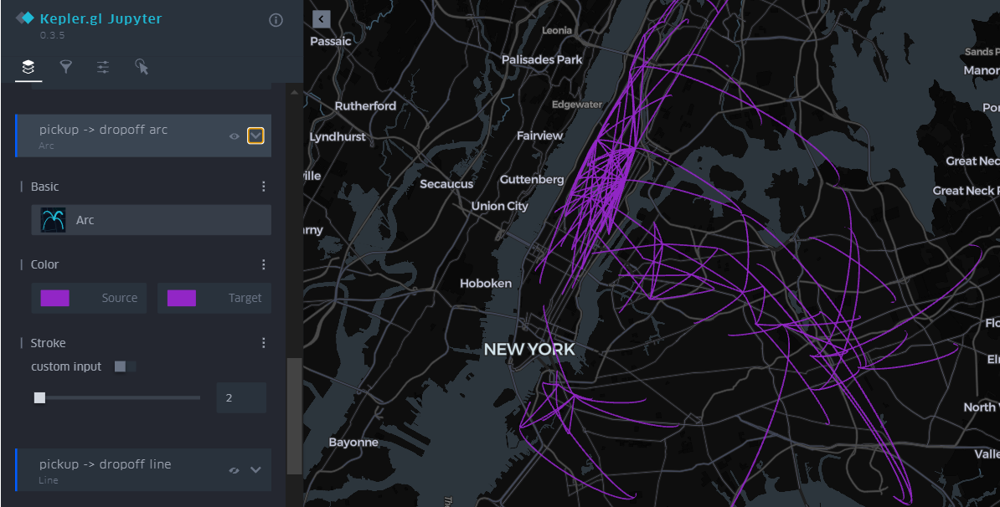

#### **Interpretation of Kepler Analysis**

In our Kepler analysis, we have used data from 10 AM to 12 AM served by each taxi service on January 3, 2023

The first Kepler visualization, we observe the pickup locations for yellow taxis represented as a heatmap. The intensity of activity is shown with colors, where yellow is high activity and red is lower activity. The majority of yellow taxi pickups occur in Manhattan, with hotspots concentrated in busy areas such as central- and lower-Manhattan. The same can be seen in the dropoff locations, as seen in the second visualization, where most dropoffs also occur within Manhattan.

These patterns suggest that yellow taxis primarily serve short trips within Manhattan. This is further supported by the visualization of taxi routes in the third image, where we see numerous short rides within the same area.

In addition, there are two significant pickup hotspots JFK Airport (southeast of Manhattan) and LaGuardia Airport (north of Manhattan).
These airports serve as transit hubs, and yellow taxis are frequently used for trips to and from these locations.

In contrast to yellow taxis, green taxis operate primarily outside Manhattan, as shown in the first visualization (Green Taxis). The routes of green taxis are more spred out compared to yellow taxis, indicating they take longer and more varied trips across New York City.

While many dropoffs occur outside Manhattan, there is also a significant number of dropoffs within Manhattan. This suggests that green taxis are often used to bring passengers from the outer boroughs into Manhattan.

By using a heatmap in this task, it becomes much easier for the audience to understand and see hotspot for the taxis. In this way, is easy to compare and see the difference between the two taxis. 

When dividing the visualizations into pick-up, drop-off and routes for the two taxis it becomes easier to compare patterns and differences within the data.

**Textbook Practice**: Apply the principle "focus your audience's attention" in Chapter 4. Explain briefly how you expect your visualization captures your audience's attention.

**Explanation** 

In our Kepler analysis, the principle of "focus your audience's attention" is applied through intentional design choices. The heatmaps use color intensity to highlight key patterns, such as high activity areas in Manhattan for yellow taxis and more dispersed routes for green taxis. The sequential presentation of pickup locations, dropoff locations, and routes ensures a logical narrative flow, guiding the audience through the findings step by step. By minimizing unnecessary details and isolating key data points, such as airport hotspots and contrasting taxi service areas, the visualizations direct focus to the main insights effectively. This approach ensures clarity and enhances the audience’s understanding of the taxi usage patterns across New York City.


### Task 4: Temporal Analysis
Analyze the temporal patterns of taxi rides. This includes the number of rides by time of day, day of the week, and month of the year. Also, analyze the relationship between temporal patterns and other variables, such as trip distance and fare. You can find very good code examples to use on this page https://www.machinelearningplus.com/time-series/time-series-analysis-python/?utm_content=cmp-true

#### **Initial analysis**

To get started with our temporal analysis, we will extract data from the pick-up datetime attribute, since this holds all relevant information (hour of the day, weekday and month of the year). This is done as preparation for the analysis, and the code is shown down below.

In [18]:
# Extract temporal features for Yellow Taxi data
df_yellow_filtered1 = df_yellow_filtered.copy()
df_green_filtered1 = df_green_filtered.copy()

df_yellow_filtered1['hour_of_day'] = df_yellow_filtered1['tpep_pickup_datetime'].dt.hour
df_yellow_filtered1['day_of_week'] = df_yellow_filtered1['tpep_pickup_datetime'].dt.dayofweek
df_yellow_filtered1['month_of_year'] = df_yellow_filtered1['tpep_pickup_datetime'].dt.month

# Extract temporal features for Green Taxi data
df_green_filtered1['hour_of_day'] = df_green_filtered1['lpep_pickup_datetime'].dt.hour
df_green_filtered1['day_of_week'] = df_green_filtered1['lpep_pickup_datetime'].dt.dayofweek
df_green_filtered1['month_of_year'] = df_green_filtered1['lpep_pickup_datetime'].dt.month

##### **Amount of Taxi Rides by Hour of Day**

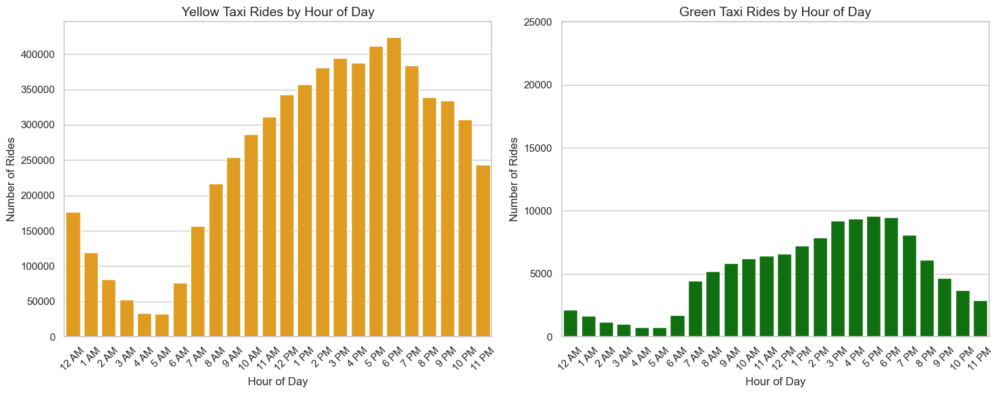

In [19]:
# Add labels for AM/PM for better readability
def format_hour(hour):
    if hour == 0:
        return '12 AM'
    elif hour < 12:
        return f'{hour} AM'
    elif hour == 12:
        return '12 PM'
    else:
        return f'{hour-12} PM'

# Map the function to the hour column in both dataframes
df_yellow_filtered1['hour_label'] = df_yellow_filtered1['hour_of_day'].apply(format_hour)
df_green_filtered1['hour_label'] = df_green_filtered1['hour_of_day'].apply(format_hour)

# Define the chronological order for hour labels
hour_order = [
    '12 AM', '1 AM', '2 AM', '3 AM', '4 AM', '5 AM', '6 AM', '7 AM', '8 AM', '9 AM', '10 AM', '11 AM',
    '12 PM', '1 PM', '2 PM', '3 PM', '4 PM', '5 PM', '6 PM', '7 PM', '8 PM', '9 PM', '10 PM', '11 PM'
]

# Convert hour_label column to a categorical type with the defined order
cat_type = CategoricalDtype(categories=hour_order, ordered=True)
df_yellow_filtered1['hour_label'] = df_yellow_filtered1['hour_label'].astype(cat_type)
df_green_filtered1['hour_label'] = df_green_filtered1['hour_label'].astype(cat_type)

# Aggregate ride counts by hour label
yellow_hourly_counts = df_yellow_filtered1.groupby('hour_label', observed=False).size().reset_index(name='ride_count')
green_hourly_counts = df_green_filtered1.groupby('hour_label', observed=False).size().reset_index(name='ride_count')

# Set the aesthetic style
sns.set_theme(style="whitegrid")

# Create the plot
fig, axes = plt.subplots(1, 2, figsize=(15, 6), sharey=False)  # Do not share y-axis for independent scaling

# Yellow Taxi Plot
sns.barplot(
    x='hour_label',
    y='ride_count',
    data=yellow_hourly_counts,
    color='orange',
    ax=axes[0]
)
axes[0].set_title('Yellow Taxi Rides by Hour of Day', fontsize=14)
axes[0].set_xlabel('Hour of Day', fontsize=12)
axes[0].set_ylabel('Number of Rides', fontsize=12)
axes[0].tick_params(axis='x', rotation=45)  # Rotate labels for readability

# Green Taxi Plot
sns.barplot(
    x='hour_label',
    y='ride_count',
    data=green_hourly_counts,
    color='green',
    ax=axes[1]
)
axes[1].set_title('Green Taxi Rides by Hour of Day', fontsize=14)
axes[1].set_xlabel('Hour of Day', fontsize=12)
axes[1].set_ylabel('Number of Rides', fontsize=12)
axes[1].tick_params(axis='x', rotation=45)  # Rotate labels for readability
axes[1].set_ylim(0, 25000)  # Limit y-axis for Green Taxi plot

# Adjust layout
plt.tight_layout()
plt.show()

Each bin in the two plots represents an hour within the 24-hour day, offering a clear visualization of taxi ride demand across different times. The first noticeable observation is that yellow taxis handle significantly more rides throughout the day compared to green taxis. This aligns with the findings from Task 3, where the spatial analysis revealed that yellow taxis primarily operate in central areas such as Manhattan, while green taxis serve suburban neighborhoods.


At peak hour (7 PM), yellow taxis record over 400,000 rides, whereas green taxis do not exhibit a sharp peak. However, the highest demand for green taxis occurs at 6 PM, with approximately 10,000 rides. The pronounced 7 PM peak for yellow taxis likely reflects increased demand in business-dense areas, driven by commuters heading home or people going out for dinner. In contrast, the more subdued 6 PM peak for green taxis may correspond to demand in residential or less urbanized areas.


#### **Number of rides by day of the week**

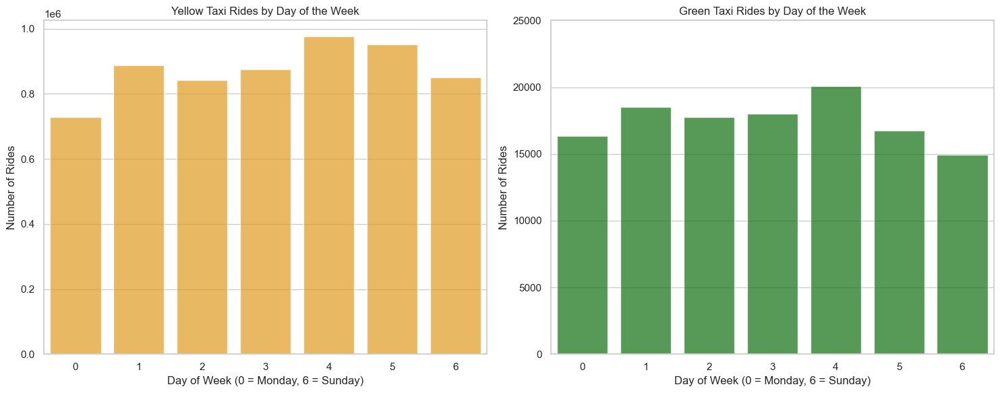

In [ ]:
# Create a figure with two subplots side by side
fig, axes = plt.subplots(1, 2, figsize=(15, 6), sharey=False)

# Yellow Taxi Plot
sns.countplot(
    x='day_of_week', 
    data=df_yellow_filtered1, 
    color='orange', 
    ax=axes[0], 
    alpha=0.7
)
axes[0].set_title('Yellow Taxi Rides by Day of the Week')
axes[0].set_xlabel('Day of Week (0 = Monday, 6 = Sunday)')
axes[0].set_ylabel('Number of Rides')

# Green Taxi Plot
sns.countplot(
    x='day_of_week', 
    data=df_green_filtered1, 
    color='green', 
    ax=axes[1], 
    alpha=0.7
)
axes[1].set_title('Green Taxi Rides by Day of the Week')
axes[1].set_xlabel('Day of Week (0 = Monday, 6 = Sunday)')
axes[1].set_ylabel('Number of Rides')
axes[1].set_ylim(0, 25000)  

# Adjust layout
plt.tight_layout()
plt.show()

The plots show the distribution of yellow and green taxi rides by day of the week, highlighting distinct usage patterns. Yellow taxis maintain consistently high demand throughout the week, peaking on weekdays (Tuesday to Friday) and dipping slightly on weekends. This reflects their focus on business-heavy areas like Manhattan.


Green taxis, with significantly fewer rides, see their highest demand midweek (Tuesday and Wednesday) and the lowest on Sunday. This aligns with their suburban and residential focus, where mobility needs are less consistent. Both taxi types experience reduced demand on Sundays, reflecting lower city-wide travel. Also, this can be due to people being more likely to own cars in suburban areas than in the city, so they might not use the taxi service as much.


#### **Rides by Month**

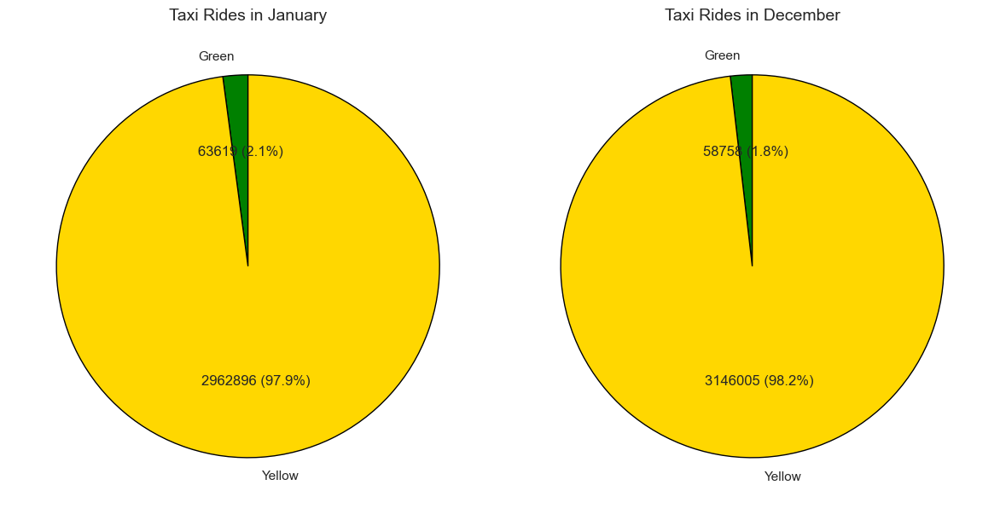

In [21]:
# Prepare data (assuming each row represents a ride)
df_yellow_filtered1['taxi_type'] = 'Yellow'
df_green_filtered1['taxi_type'] = 'Green'

# Combine Yellow and Green taxi data
combined_df = pd.concat([df_yellow_filtered1, df_green_filtered1])

# Filter for January (1) and December (12)
combined_df_filtered = combined_df[combined_df['month_of_year'].isin([1, 12])]

# Aggregate data to count rides by month and taxi type
ride_counts = combined_df_filtered.groupby(['month_of_year', 'taxi_type']).size().reset_index(name='ride_count')

# Separate data for January and December
january_data = ride_counts[ride_counts['month_of_year'] == 1]
december_data = ride_counts[ride_counts['month_of_year'] == 12]

# Custom autopct function to display both numerical values and percentages
def autopct_with_numbers(pct, all_values):
    absolute = int(round(pct / 100. * sum(all_values)))
    return f"{absolute} ({pct:.1f}%)"

# Create pie charts
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# January Pie Chart
axes[0].pie(
    january_data['ride_count'], 
    labels=january_data['taxi_type'], 
    autopct=lambda pct: autopct_with_numbers(pct, january_data['ride_count']), 
    colors=['green', '#FFD700'], 
    startangle=90, 
    wedgeprops={'edgecolor': 'black'}
)
axes[0].set_title('Taxi Rides in January', fontsize=14)

# December Pie Chart
axes[1].pie(
    december_data['ride_count'], 
    labels=december_data['taxi_type'], 
    autopct=lambda pct: autopct_with_numbers(pct, december_data['ride_count']), 
    colors=['green', '#FFD700'], 
    startangle=90, 
    wedgeprops={'edgecolor': 'black'}
)
axes[1].set_title('Taxi Rides in December', fontsize=14)

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

This pie chart reinforces the trend seen in other analyses: yellow taxis dominate in central areas and consistently maintain higher ride counts, while green taxis cater to less dense, residential areas with significantly lower demand. Seasonal factors, like the holiday season, appear to influence both taxi types, albeit to different extents.

## **Comparison between the different attributes**

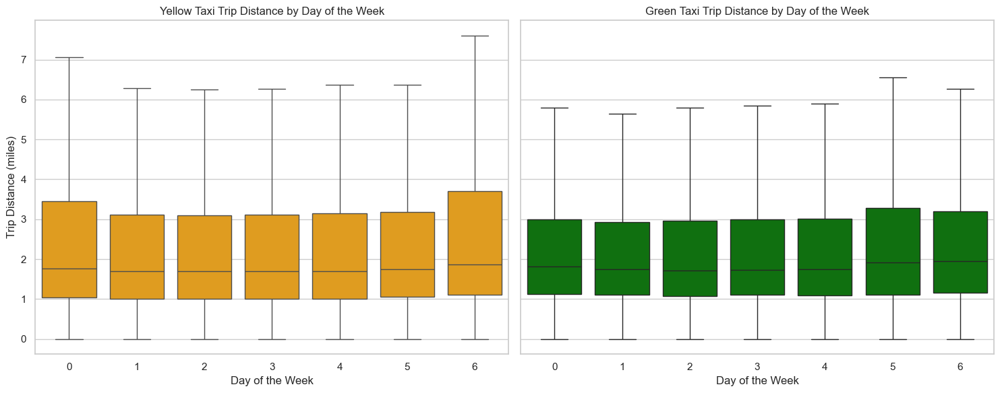

In [22]:
# Create a figure with two subplots side by side
fig, axes = plt.subplots(1, 2, figsize=(15, 6), sharey=True)

# Yellow Taxi Box Plot
sns.boxplot(
    x='day_of_week', 
    y='trip_distance', 
    data=df_yellow_filtered1,  
    color='orange', 
    ax=axes[0], 
    showfliers=False  # Exclude outliers for clearer visualization
)
axes[0].set_title('Yellow Taxi Trip Distance by Day of the Week')
axes[0].set_xlabel('Day of the Week')
axes[0].set_ylabel('Trip Distance (miles)')

# Green Taxi Box Plot
sns.boxplot(
    x='day_of_week', 
    y='trip_distance', 
    data=df_green_filtered1,  
    color='green', 
    ax=axes[1], 
    showfliers=False  
)
axes[1].set_title('Green Taxi Trip Distance by Day of the Week')
axes[1].set_xlabel('Day of the Week')
axes[1].set_ylabel('Trip Distance (miles)')

# Adjust layout
plt.tight_layout()
plt.show()

The boxplots above visualize the distribution of the trip distances for the yellow and green taxi cab. We will analyze them separately.

For the yellow taxi, the interquartile range is pretty much the same throughout workdays Tuesday-Saturday, and is observed to be wider on Mondays and Sundays. The whiskers extend up to approximately 6–7 miles, with some outliers beyond that range, observed on Sunday. This could be due to people travelling to extended family on off-days. The median is below 2 miles across all weekdays, indicating that they primarily make shorter trips, which makes sense since the yellow taxi cab caters to mostly Manhattan, a central area.


For the green taxi cab, the interquartile range is narrower, which suggests that trip distances are generally shorter. Generally, the ranges are the same throughout the week, with Saturday having the widest range. The whiskers are generally a little below 6 miles, with Saturday and Sunday having larger trip distances, going up to approx. 7.5 miles. The median looks to be the same as for the yellow taxi cab, indicating shorter trips also.


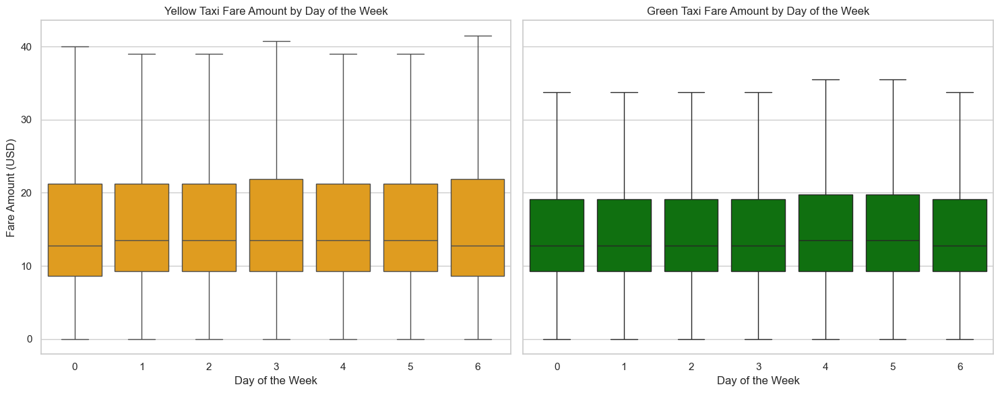

In [23]:
# Create a figure with two subplots side by side
fig, axes = plt.subplots(1, 2, figsize=(15, 6), sharey=True)

# Yellow Taxi Box Plot for Fare Amount
sns.boxplot(
    x='day_of_week', 
    y='fare_amount', 
    data=df_yellow_filtered1, 
    color='orange', 
    ax=axes[0], 
    showfliers=False 
)
axes[0].set_title('Yellow Taxi Fare Amount by Day of the Week')
axes[0].set_xlabel('Day of the Week')
axes[0].set_ylabel('Fare Amount (USD)')

# Green Taxi Box Plot for Fare Amount
sns.boxplot(
    x='day_of_week', 
    y='fare_amount', 
    data=df_green_filtered1, 
    color='green', 
    ax=axes[1], 
    showfliers=False  
)
axes[1].set_title('Green Taxi Fare Amount by Day of the Week')
axes[1].set_xlabel('Day of the Week')
axes[1].set_ylabel('Fare Amount (USD)')

# Adjust layout
plt.tight_layout()
plt.show()

In this visualization, we thought it would be interesting to see if there were any vivid differences in the fare amounts across the weekdays. For the yellow taxi cab, the median fare amount seems to be the same from Tuesday to Saturday, while being lower on Mondays and Sundays. This means that generally, taxing a yellow taxi cab throughout the week is more expensive -- but that could make sense, since the yellow taxi cab catters mostly to the city, where people travel to and from work. For the green taxi cab, there are also some trends. The median fare is the same Monday-Thursday and Sunday, while being a bit higher on Fridays and Saturdays. This suggests that demand is higher on these days, probably due to weekend activities, where longer trips may be at play.

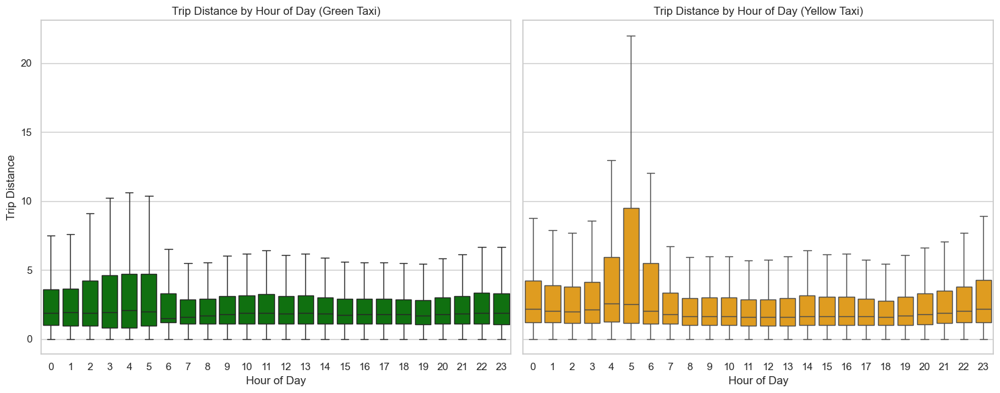

In [24]:
# Create a figure with two subplots side by side
fig, axes = plt.subplots(1, 2, figsize=(15, 6), sharey=True)

# Yellow Taxi Box Plot
sns.boxplot(
    x='hour_of_day', 
    y='trip_distance', 
    data=df_yellow_filtered1, 
    color='orange', 
    showfliers=False, 
    ax=axes[1]
)

# Green Taxi Box Plot
sns.boxplot(
    x='hour_of_day', 
    y='trip_distance', 
    data=df_green_filtered1, 
    color='green', 
    showfliers=False, 
    ax=axes[0]
)
axes[0].set_title('Trip Distance by Hour of Day (Green Taxi)')
axes[0].set_xlabel('Hour of Day')
axes[0].set_ylabel('Trip Distance')


axes[1].set_title('Trip Distance by Hour of Day (Yellow Taxi)')
axes[1].set_xlabel('Hour of Day')
axes[1].set_ylabel('Trip Distance')

plt.tight_layout()
plt.show()

Another interesting visual would be to see how the trip distances are distributed throughout the day. This could give a good reflection of day-patterns and find behavioral patterns. What stands out from both of these boxplot visualizations, is that trip distances (for both taxi cabs) seem to be longest between the hours 3AM-7AM, and pretty equally distributed throughout all the other hours of the day, with slight increases in the hours creeping towards midnight. Our best qualified guess for this, is that people are commuting to and from the airport. JFK is approximately 17 miles from Manhattan, so that could explain why the IQR and max observation is higher for the yellow taxi can, compared to the green taxi cab (in the hours between 3AM-7AM)



**Textbook Practice**: Use the principle "clutter is your enemy" to simplify your plots/graphs properly. Explain your motivation for each plot.

**Explanation**
In the temporal analysis above, we have used boxplots, pie charts and time series histograms to declutter our visualizations.  According to the textbook, each element in a chart requires cognitive effort; therefore, removing unnecessary components is essential to present the data in a clear and effective manner. This reflects the principle that “clutter is your enemy,” which underlines the importance of simplifying visuals to allow the data to communicate the story without distractions. To further enhance clarity, we have chosen colors to draw attention to key comparisons, such as using distinct colors for yellow and green taxis, ensuring immediate differentiation. This deliberate use of color, combined with the removal of unnecessary gridlines and decorative elements, helps focus the audience’s attention on the patterns and relationships that matter most. By applying strategies such as alignment, contrast, and white space, our visualizations create a cleaner and more intuitive presentation of the data.


### Task 5: Time-Series Forecasting
Use Prophet or a similar tool to forecast the number of taxi rides in the future, respectively for green and yellow taxis. This includes creating a time-series model, tuning its parameters, and validating its performance. Also, interpret the model's predictions and identify the factors driving the forecasted trends.

A good example for using Prophet to do time-series forecasting can be found here https://www.kaggle.com/code/prashant111/tutorial-time-series-forecasting-with-prophet

**Modeling Details**:
Conduct parameter tuning for the forecasting model. Use cross-validation techniques appropriate for time series data, like time-based splitting.

**Evaluation Metrics**:
Specify which metrics will be used to evaluate the forecasting model, such as MAE (Mean Absolute Error), RMSE (Root Mean Square Error), or MAPE (Mean Absolute Percentage Error). Explain why these metrics are suitable (or not suitable) for the task.

**Visualization and Textbook Practice**: Plotting the forecasts against actual values to visually assess the model's performance. Creating a plot that shows how the forecast and confidence intervals change over time. You need to explain how the principles below are used for making this plot:
- "Choose an appropriate display" (Chapter 2)
- "Eliminate clutter" (Chapter 3)
- "Draw attention shere you want it" (Chapter 4)
- "Think like a designer" (Chapter 5)

**Hint**: In order to evaluate how your model performs, you need to split the dataset to be train and test. For time-series data, we cannot randomly select the data record (i.e. the rows) to be in train or test. Namely, all training data must be before the earliest test data. In other words, the model is always trained on historical data and then used to forecast the future.

In [25]:
# Define the months and year you're interested in
months_train = ['01', '02', '03', '04', '05']
month_test = ['06']
year = '2023'

# Create empty lists to store the data frames
df_yellow_list_1 = []
df_green_list_1 = []

# Loop over the months for training data
for month in months_train:
    dfy = pd.read_parquet(base_url_yellow.format(year=year, month=month))
    dfg = pd.read_parquet(base_url_green.format(year=year, month=month))

    df_yellow_list_1.append(dfy)
    df_green_list_1.append(dfg)

# Concatenate the list of data frames into a single data frame
df_yellow_train = pd.concat(df_yellow_list_1)
df_green_train = pd.concat(df_green_list_1)

# Loop for the test month
df_yellow_test = pd.read_parquet(base_url_yellow.format(year=year, month=month_test[0]))
df_green_test = pd.read_parquet(base_url_green.format(year=year, month=month_test[0]))

df_yellow_train_filtered_1 = df_yellow_train[columns_yellow]
df_green_train_filtered_1 = df_green_train[columns_green]

df_yellow_test_filtered_1 = df_yellow_test[columns_yellow]
df_green_test_filtered_1 = df_green_test[columns_green]

common_column_names = [
    'pickup_datetime', 'dropoff_datetime', 'PULocationID', 'DOLocationID',
    'trip_distance', 'fare_amount', 'payment_type', 'passenger_count'
]

df_yellow_train_filtered_1.columns = common_column_names
df_green_train_filtered_1.columns = common_column_names

df_yellow_test_filtered_1.columns = common_column_names
df_green_test_filtered_1.columns = common_column_names

# Exclude datetime columns and filter non-negative values
non_datetime_columns = ['trip_distance', 'fare_amount', 'payment_type', 'passenger_count']

df_yellow_train_filtered = df_yellow_train_filtered_1[(df_yellow_train_filtered_1[non_datetime_columns] >= 0).all(axis=1)]
df_green_train_filtered = df_green_train_filtered_1[(df_green_train_filtered_1[non_datetime_columns] >= 0).all(axis=1)]

df_yellow_test_filtered = df_yellow_train_filtered_1[(df_yellow_train_filtered_1[non_datetime_columns] >= 0).all(axis=1)]
df_green_test_filtered = df_green_test_filtered_1[(df_green_test_filtered_1[non_datetime_columns] >= 0).all(axis=1)]

In [26]:
# Aggregate data by date for forecasting
df_yellow_forecast_train = df_yellow_train_filtered_1.resample('D', on='pickup_datetime').size().reset_index(name='rides')
df_green_forecast_train = df_green_train_filtered_1.resample('D', on='pickup_datetime').size().reset_index(name='rides')

df_yellow_forecast_test = df_yellow_test_filtered_1.resample('D', on='pickup_datetime').size().reset_index(name='rides')
df_green_forecast_test = df_green_test_filtered_1.resample('D', on='pickup_datetime').size().reset_index(name='rides')

# Rename columns for Prophet
df_yellow_forecast_train.columns = ['ds', 'y']
df_green_forecast_train.columns = ['ds', 'y']

df_yellow_forecast_test.columns = ['ds', 'y']
df_green_forecast_test.columns = ['ds', 'y']

# Filtwe train + testdata
df_train_g = df_green_forecast_train[df_green_forecast_train['ds'].dt.strftime('%Y-%m').isin([f"{year}-{m}" for m in months_train])]
df_test_g = df_green_forecast_test[df_green_forecast_test['ds'].dt.strftime('%Y-%m').isin([f"{year}-{m}" for m in month_test])]

df_train_y = df_yellow_forecast_train[df_yellow_forecast_train['ds'].dt.strftime('%Y-%m').isin([f"{year}-{m}" for m in months_train])]
df_test_y = df_yellow_forecast_test[df_yellow_forecast_test['ds'].dt.strftime('%Y-%m').isin([f"{year}-{m}" for m in month_test])]

In [27]:
#Train the model on both green and yellow taxis 
model_green = Prophet()
model_green.fit(df_train_g)

model_yellow = Prophet()
model_yellow.fit(df_train_y)

17:27:06 - cmdstanpy - INFO - Chain [1] start processing
17:27:06 - cmdstanpy - INFO - Chain [1] done processing
17:27:06 - cmdstanpy - INFO - Chain [1] start processing
17:27:06 - cmdstanpy - INFO - Chain [1] done processing


In [28]:
# We use Prophet's built-in cross-validation function on both green and yellow taxis.
df_cv_green = cross_validation(
    model_green, horizon='28 days'
)

# Cross-validation for the yellow model
df_cv_yellow = cross_validation(
    model_yellow, horizon='28 days'
)

# Calculate performance metrics for both models
df_metrics_green = performance_metrics(df_cv_green)
df_metrics_yellow = performance_metrics(df_cv_yellow)

# Display the results
print("\nGreen Model Performance Metrics:")
print(df_metrics_green[['rmse','mae','mape']].tail(1))

print("\nYellow Model Performance Metrics:")
print(df_metrics_yellow[['rmse','mae','mape']].tail(1))

  0%|          | 0/3 [00:00<?, ?it/s]

17:27:06 - cmdstanpy - INFO - Chain [1] start processing
17:27:06 - cmdstanpy - INFO - Chain [1] done processing
17:27:06 - cmdstanpy - INFO - Chain [1] start processing
17:27:06 - cmdstanpy - INFO - Chain [1] done processing
17:27:06 - cmdstanpy - INFO - Chain [1] start processing
17:27:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

17:27:06 - cmdstanpy - INFO - Chain [1] start processing
17:27:06 - cmdstanpy - INFO - Chain [1] done processing
17:27:06 - cmdstanpy - INFO - Chain [1] start processing
17:27:06 - cmdstanpy - INFO - Chain [1] done processing
17:27:06 - cmdstanpy - INFO - Chain [1] start processing
17:27:06 - cmdstanpy - INFO - Chain [1] done processing



Green Model Performance Metrics:
          rmse         mae      mape
25  263.993306  206.979675  0.095794

Yellow Model Performance Metrics:
            rmse           mae      mape
25  16507.320119  13245.283916  0.130579


In [29]:
# Create the forecast using the model (Extend the time range by 30 days + prediction)
future_yellow = model_yellow.make_future_dataframe(periods=30)  
forecast_yellow = model_yellow.predict(future_yellow)

#Interactive plot using Plotly in-buildt function
interactive_fig = plot_plotly(model_yellow, forecast_yellow)

#Adding the actual test data (df_test_y) to the plot manually
actual_data = go.Scatter(
    x=df_test_y['ds'],  
    y=df_test_y['y'],  
    mode='markers',
    name='Actual Data',  
    line=dict(color='orange', width=2)
)

#Adding titles to the plot for enhance clarity and communication (Textbook)
interactive_fig.update_layout(
    title="Forecast vs Actual Yellow Taxi Rides",  
    xaxis_title="Months",               
    yaxis_title="Number of Rides"     
)

#Adding the actual data trace to the figure
interactive_fig.add_trace(actual_data)
interactive_fig.show()
# screenshots are shown of the actual interactive plot:) 

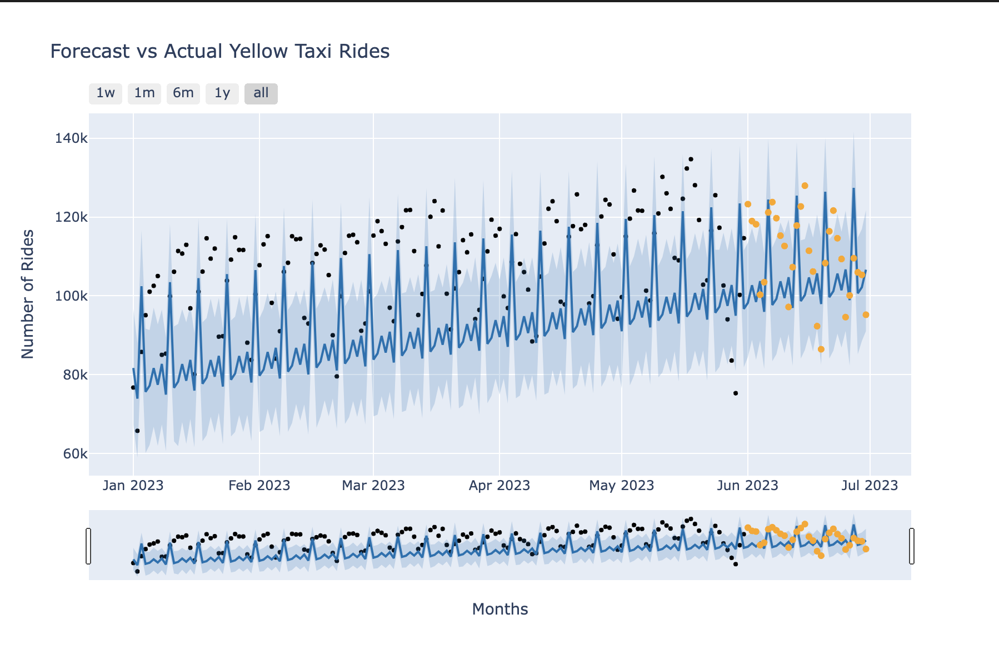

In [30]:
#We used the ame code as above but adjusted the values for the green taxi.

# Create the forecast using the model (Extend the time range by 30 days + prediction)
future_green = model_green.make_future_dataframe(periods=30)  # Extend the time range by 30 days
forecast_green = model_green.predict(future_green)  # Make predictions

#Interactive plot using Plotly in-buildt function
interactive_fig = plot_plotly(model_green, forecast_green)

#Adding the actual test data (df_test_g) to the plot manually
actual_data = go.Scatter(
    x=df_test_g['ds'],  
    y=df_test_g['y'],   
    mode='markers',
    name='Actual Data',  
    line=dict(color='orange', width=2)
)

#Adding titles to the plot for enhance clarity and communication (Textbook)
interactive_fig.update_layout(
    title="Forecast vs Actual Green Taxi Rides",  
    xaxis_title="Months",               
    yaxis_title="Number of Rides"   
)

#Adding the actual data trace to the figure
interactive_fig.add_trace(actual_data)
interactive_fig.show()

# screenshots are shown of the actual interactive plot:) 

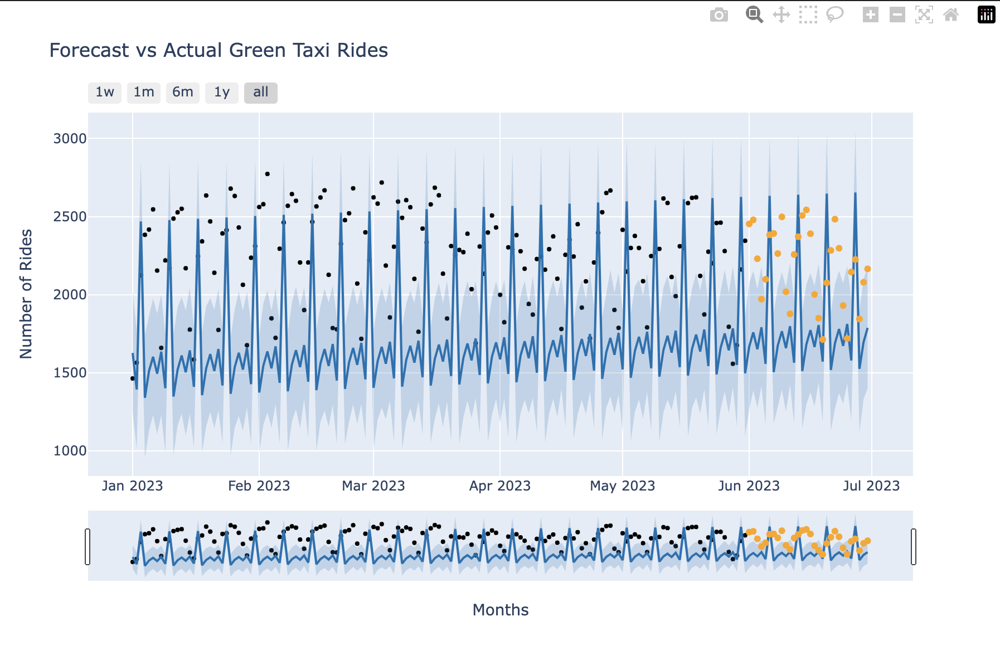

#### **Interpretation of Task 5**

To solve the task of forecasting the number of taxi rides for green and yellow taxis, we used Prophet, a time-series forecasting tool. The following steps are step-by-step on how we decided to approach it:

1. Model Implementation: Separate models were trained for green and yellow taxi data. Seasonality was automatically detected by Prophet, capturing key periodic trends like weekly and yearly cycles. The models were trained using pre-processed daily aggregated data.

2. Cross-Validation: Prophet's built-in cross-validation function was used for both models, specifying a 28-day time period. This aligns with the task description to validate performance iteratively on historical data using appropriate cross-validation techniques for time-series.

3. Evaluation Metrics: The performance of the models was assessed using RMSE, MAE, and MAPE, which are different performance metrics for time-series forecasting. These metrics are used to evaluate our models by measuring absolute error, percentage error, and their squared equivalents. Below are the evaluations from our forecast. 

   - For the green taxi model, the RMSE (263.99), MAE (206.98), and MAPE (9.58%) indicate that the model provided reasonably accurate forecasts with low absolute and percentage errors.
   - For the yellow taxi model, the RMSE (16507.32), MAE (13,245.28), and MAPE (13.06%) highlight a higher degree of error, suggesting that the model struggled to capture the variability in the data.

    Among these metrics, MAPE is the most relevant for comparing model performance in this context, as it offers a clear and interpretable measure of error in percentage terms, making it easier to assess the model's accuracy relative to the scale of the data. In regards to the higher MAPE observed for yellow taxis, this likely indicates the need for further refinement, such as parameter tuning or the inclusion of additional explanatory variables, to enhance the model’s predictive accuracy.

4. Forecasting: The models were used to generate forecasts for an additional 30 days beyond the test period. Using Plotly, we visualized these predictions interactively, overlaying the test data to compare observed values with the forecasted results. This provided a clear picture of the models’ accuracy and areas for improvement.

**Textbook practice explanation:**

All of our forecasts were of course presented in visuals. Our visualizations compared forecasts with actual values and showed how predictions and confidence intervals evolved over time.

In our visualizations, we compared the forecasts to the actual values, effectively showcasing how the predictions and confidence intervals change over time. To enhance clarity, we included an interactive plot, allowing users to zoom in and explore specific time periods. The test data was highlighted in orange to distinguish it from the forecasted blue line and shaded confidence intervals, ensuring attention was drawn to the critical comparison between predictions and reality.

We followed key design principles form the textbook to create clear and effective visuals. Line graphs were selected for their suitability in illustrating time-series data, with overlaid scatter points for actual values to emphasize the relationship between predictions and observations. Unnecessary elements like excessive gridlines were removed to declutter the visuals, keeping the focus on essential trends. By structuring the graphs logically and using clear labels, we ensured readability and interpretability. The interactive format further enriched the visualization, allowing for deeper insights into specific periods.
